# Clustering of all data

Read in all necessary packages:

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pandas.io.parsers import read_csv
import scvelo as scv
import scanpy as sc
import numpy as np
from functools import reduce
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts
import loompy
import scanpy.external as sce

In [2]:
scv.settings.verbosity = 3 # show errors(0), warnings(1), info(2), hints(3)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scv.settings.presenter_view = True  # set max width size for presenter view
#scv.set_figure_params('scvelo')  # for beautified visualization
sc.set_figure_params(dpi=100, color_map = 'viridis')

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.6.0 pandas==1.2.0 scikit-learn==0.24.0 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


# Load the dataset

In [3]:
pathToData = '/Users/m.blotenburg/Documents/Projects/TCHIC/data/rep2/20210215_OUD5651_K27me3K4me3_day5_20201023fixed/'

In [4]:
adata_file = pathToData + '/dataframes/20210224_TCHIC_rep2_Scanpy.h5ad' 

In [5]:
adata = sc.read(adata_file)


In [6]:
adata

AnnData object with n_obs × n_vars = 4396 × 27312
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype', 'cellnames', 'bc', 'cellname'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'celltype_colors', 'day_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'mark_colors', 'neighbors', 'pca', 'rank_genes_groups', 'replicates_colors', 'umap', 'umap_density_mark_params'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

# Scanpy

### Known marker genes

Overview of louvain clusters, cell type annotation, known marker genes and marker genes as defined by Scanpy.
(120hAA)

Louvain Group | Cell type | Known marker genes | Scanpy marker genes
---|---|---|---
1 | Neurons | Sox1, Sox2 | Sox1, Sox2, Sox13, Ncam1, Crabp2, Nkx1-2, Gbx2, Hoxc8, Hoxb9, Hoxc9
2 | Anterior neural / Neurectoderm | Foxg1 | Sox1, Sox21, Tmsb4x, Epha4
3 | Branchial arches | Onecut2, Elavl3, Tmsb4x, Celsr3, Btbd17 | Onecut2, Elavl3, Tmsb4x, Hes6
4 | Early endoderm | Prdm1, Irx1 | Peg3, Prrx1, Prrx2, Pbx1, Meis2 | -
5 | Endoderm | Foxa2, Cdh1, Sox17, Trh, 
6 | Early heart progenitors | Bmp4, Gata4, Gata6, Hand1, Hand2 | Bmp4, Runx1t1, Gata6, Msx1, Nrp1, Peg10
7 | Allantois (?) | Tbx4 | Mdm2, Klf9, Stx3, Cdkn1a, Ccng1
8 | Presomitic mesoderm | Dll1, Hes7, Snai1, Hes5, Dkk1, Lfng | Dll1, Hes7, Rspo3, Dll3, Tbx6
9 | Early somitic | Eya1, Pax3, Six1, Cer1 | Eya1, Pax3, Meox1, Cadm1, Nav1
10 | Somitogenesis wavefront | Aldh1a2, Notch1, Lfng | Aldh1a2, Notch1, Foxc1, Foxc2, Foxp1, Lef1
11 | Tailbud | T, Wnt3a, Cdx2, Fgf8 | T, Foxb1, Fgf17, Rspo3, Hoxc6, Hoxc8, Hes7
12a | PGCs | Sox2, Nanog | Nanog, Mt1, Mt2
12b | Node | Cdh1, Trh, Nodal, Sox17, Epcam | Cdh1, Trh
13 | Haemogenic | Sox7 | Car2, Kdr

Check if everything still looks the same 

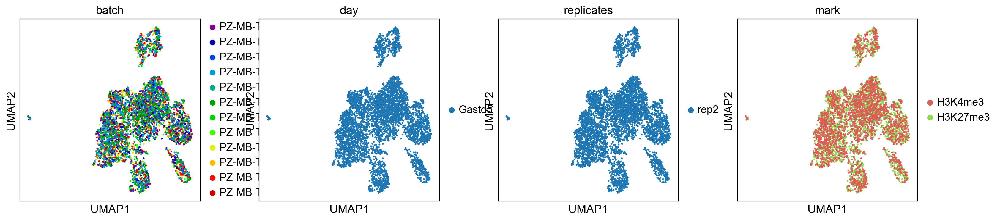

In [7]:
sc.pl.umap(adata, color=['batch','day', 'replicates', 'mark'],size=20)

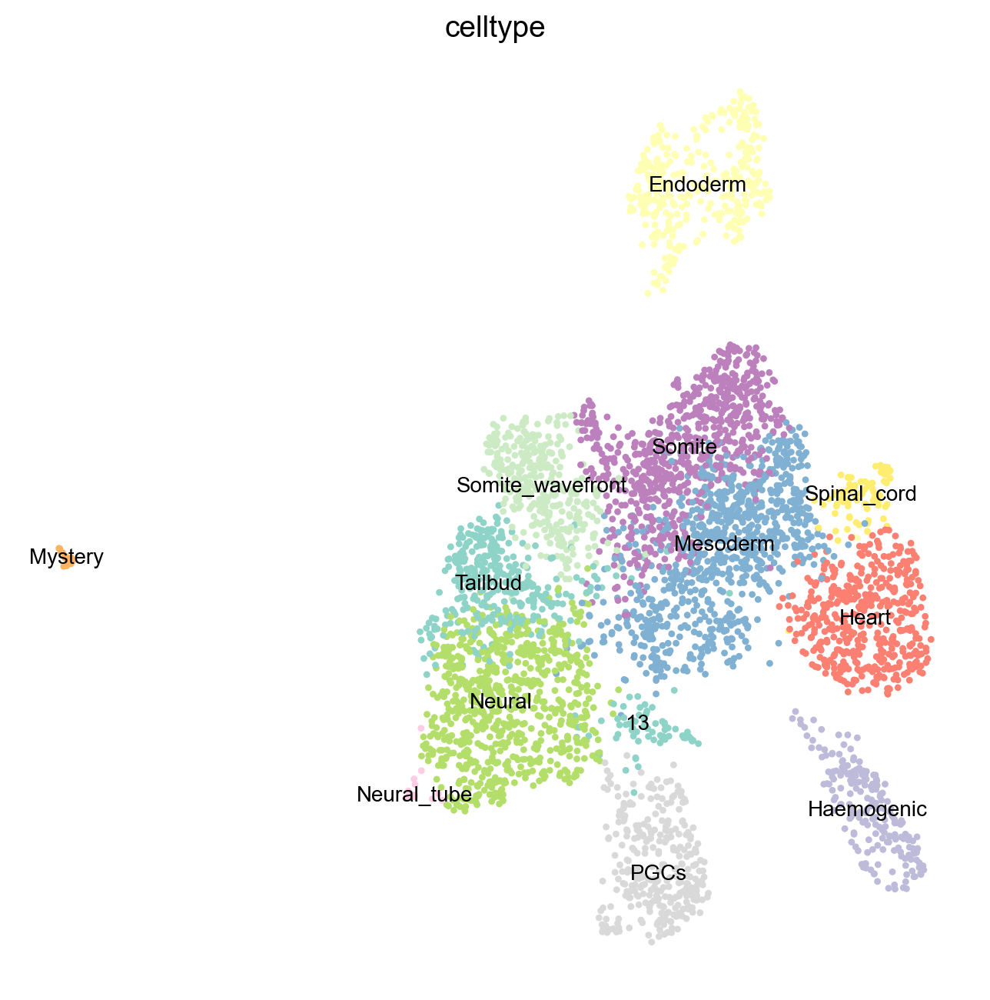

In [8]:
fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, ax=ax, frameon = False, color='celltype', legend_fontsize=10,
           palette = sns.color_palette('Set3',13), legend_loc="on data",legend_fontweight='normal', size=40)

computing density on 'umap'
--> added
    'umap_density_mark', densities (adata.obs)
    'umap_density_mark_params', parameter (adata.uns)


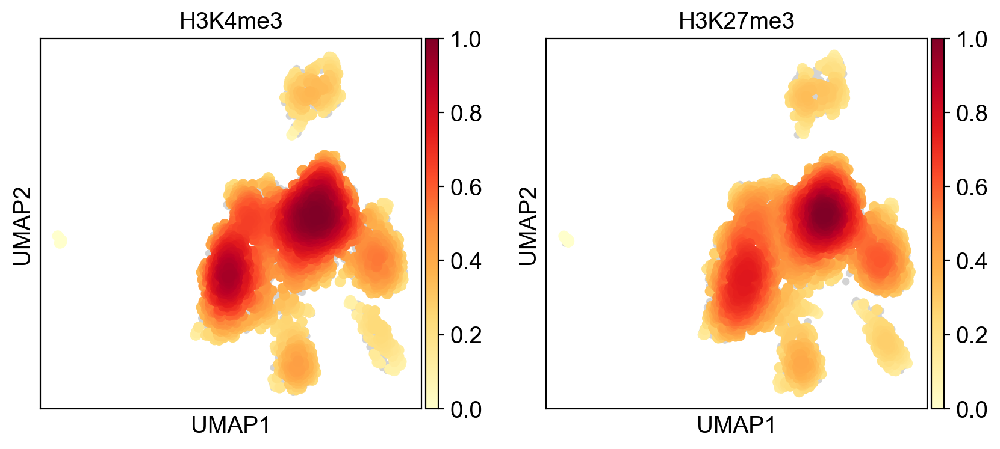

In [9]:
sc.tl.embedding_density(adata, groupby='mark')
sc.pl.embedding_density(adata, groupby='mark')

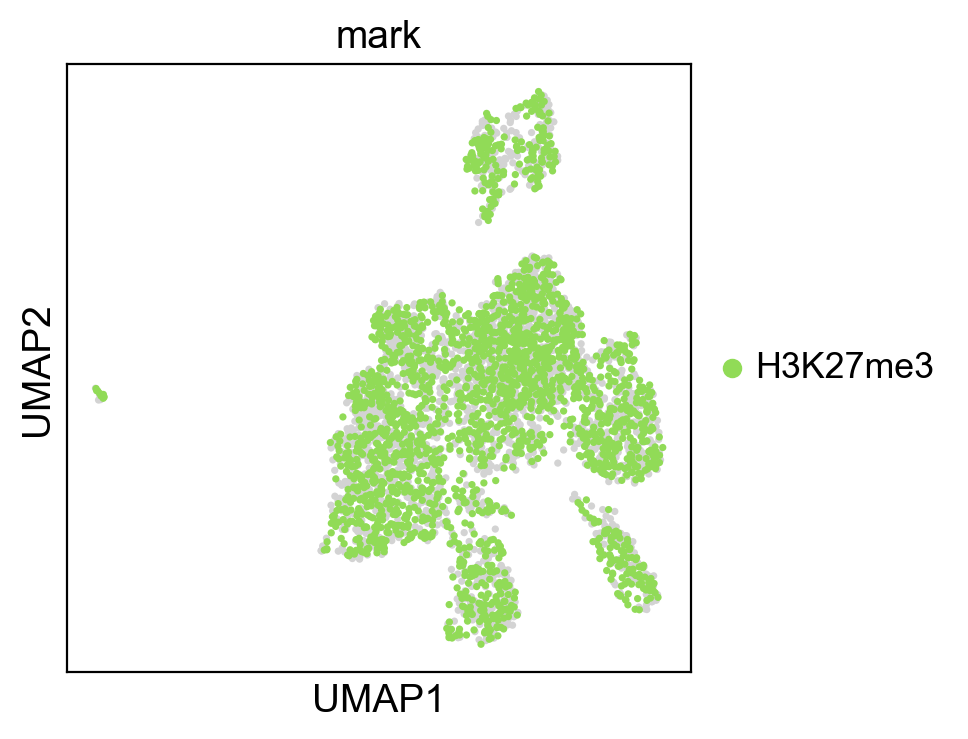

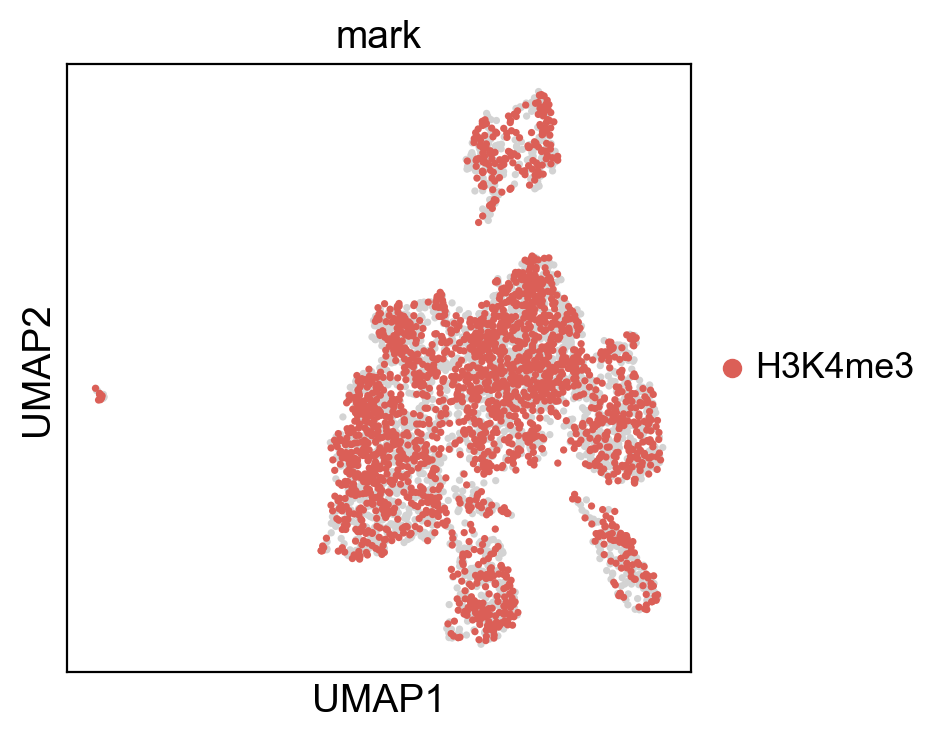

In [10]:
for batch in adata.obs['mark'].unique():
    sc.pl.umap(adata, color='mark', groups=[batch])

## Various ways of displaying interesting (marker) genes

In [11]:
# if your color map is being annoying, rerun this:
sc.set_figure_params(dpi=100, color_map = 'viridis')

First, define lists of interesting genes and marker genes.

In [12]:
polycomb = ['Jarid2', "Eed","Ezh2", "Prc1", "Ring1", "Suz12", "Phc1","Phc2", "Suv39h2"] #Prc2
k4 = ['Setd5', 'Setd1a', 'Setd3', 'Setdb2', 'Setd7', 'Setd1b','Jarid2']

markergenes = ['Esrrb', 'Dppa2', 'Dppa4', 'Nanog', 'Dppa5a','Gsc', 'Klf9', 'Klf2', 'Utf1', 'Pim2', 
               'Dppa3', 'Dnmt3b', 'Dazl', #PGC
               'Cdh1', 'Trh', 'Sox17', 'Nodal', 'Epcam', 'Foxa2', 'Lefty1', #endoderm/PGC/node
               'Sox7','Kdr','Car2', #haemogenic
               'Bmp4', 'Gata4', 'Gata6', 'Hand1', 'Hand2', #heart
               'Dll1', 'Hes7', 'Uncx', 'Snai1', 'Hes5', 'Dkk1', #presomitic
               'Eya1', 'Pax3', 'Six1', 'Cer1', #early somite
               'Aldh1a2', 'Notch1', 'Lfng', #wavefront
               'Onecut2', 'Elavl3', 'Crabp1', #neural tube/branchial arches
               'Wnt3a', 'Fgf8', 'T', 'Cdx2', #posterior
               'Sox21', 'Nkx1-2', #neural SOX2 SOX1
               'Prdm1', 'Irx1', 'Eomes', 'Meox1','Tbx4', 'Sox3','H19', 'Xist','Gata2', 'Gata3','Gata4' #other   
              ]

hox = adata.var.filter(regex=r'Hox', axis=0).index

In [13]:
#sc.pl.umap(adata, color=markergenes, use_raw=True, color_map = 'viridis')

In [14]:
#sc.pl.umap(adata, color=hox, use_raw=True, color_map = 'viridis')

In [15]:
#sc.pl.umap(adata, color=k4, use_raw=True, color_map = 'viridis')

In [16]:
#sc.pl.umap(adata, color=polycomb, use_raw=True, color_map = 'viridis')

You can also make a heatmap. ! this takes a bit of time to compute.

In [17]:
#sc.pl.heatmap(adata, var_names = adata.var_names[adata.var['highly_variable'] & (np.log(adata.var['means'])>-1)])

If you want to compare a certain gene across groups, use the following.

In [18]:
#sc.pl.violin(adata, markergenes, groupby='leiden', size = 1)

Now that we annotated the cell types, let us visualize the marker genes.

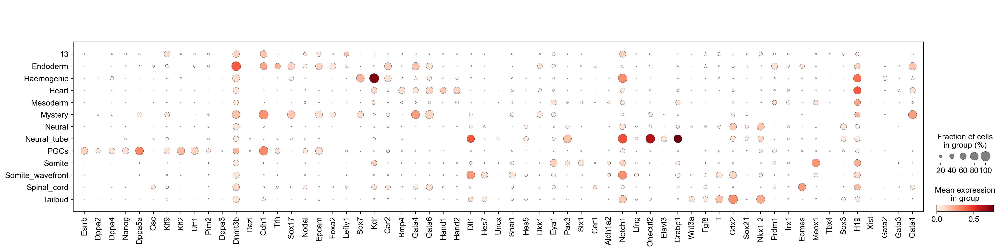

In [19]:
ax = sc.pl.dotplot(adata, markergenes, groupby='celltype', title = '') # ,save='dotplot_markergenes.png')

There is also a very compact violin plot.

In [20]:
#ax = sc.pl.stacked_violin(adata, markergenes, groupby='celltype', rotation=90)

## subset the data. 
Here we choose the neuronal lineage

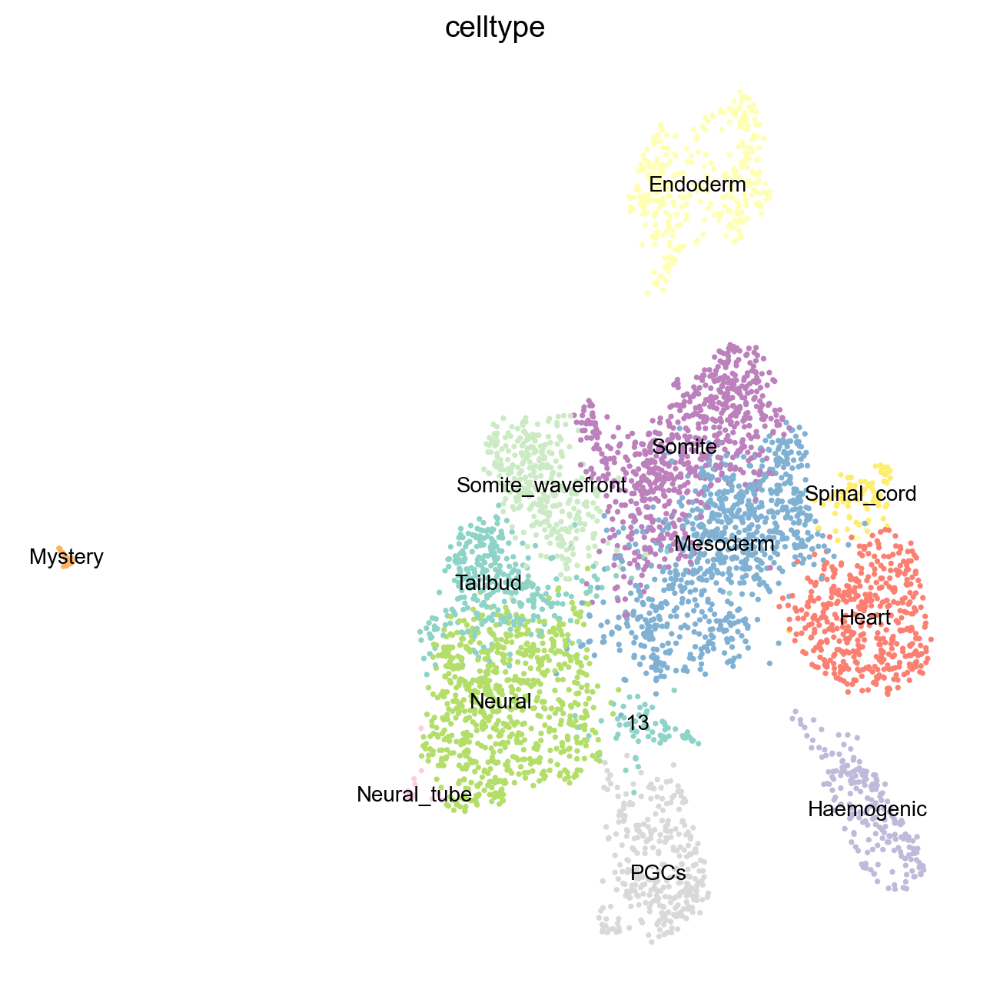

In [21]:
fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata, color = 'celltype', ax=ax, legend_loc = "on data", legend_fontsize=10, frameon=False,legend_fontweight='light')

In [22]:
adata.obs['celltype'].unique()

['Somite', 'Tailbud', 'Neural', 'Mesoderm', 'PGCs', ..., 'Somite_wavefront', '13', 'Haemogenic', 'Spinal_cord', 'Neural_tube']
Length: 13
Categories (13, object): ['Somite', 'Tailbud', 'Neural', 'Mesoderm', ..., '13', 'Haemogenic', 'Spinal_cord', 'Neural_tube']

In [23]:
main_clusters = ['Somite', 'Tailbud', 'Neural', 'Mesoderm', 'Heart', 'Somite_wavefront', 'Spinal_cord', 'Neural_tube']
adata_main = adata[adata.obs['celltype'].isin(main_clusters)]


In [24]:
print('Main')
print(adata_main.obs['celltype'].unique())

Main
['Somite', 'Tailbud', 'Neural', 'Mesoderm', 'Heart', 'Somite_wavefront', 'Spinal_cord', 'Neural_tube']
Categories (8, object): ['Somite', 'Tailbud', 'Neural', 'Mesoderm', 'Heart', 'Somite_wavefront', 'Spinal_cord', 'Neural_tube']


Choose which subset to run through the analysis

In [25]:
adata_sub = adata
adata_sub

AnnData object with n_obs × n_vars = 4396 × 27312
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype', 'cellnames', 'bc', 'cellname'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'celltype_colors', 'day_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'mark_colors', 'neighbors', 'pca', 'rank_genes_groups', 'replicates_colors', 'umap', 'umap_density_mark_params'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

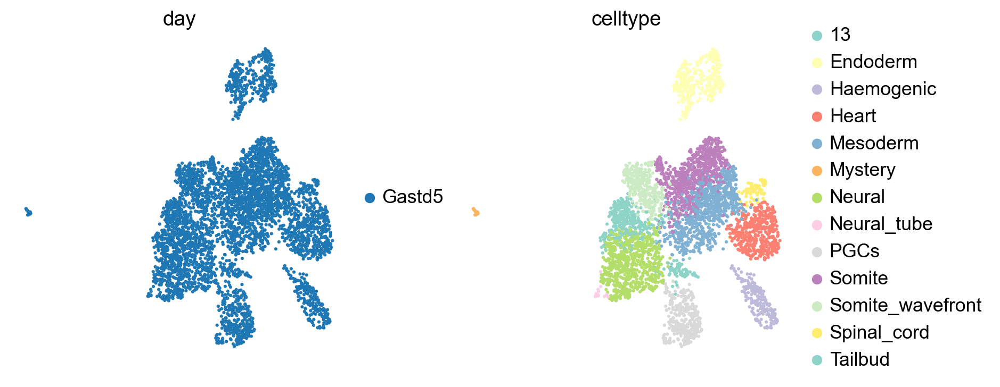

In [26]:
#fig,ax = plt.subplots(figsize=(8,8))
sc.pl.umap(adata_sub, frameon = False, color=['day', 'celltype'],size=20)

We can calculate the top differentially expressed genes from the beginning to the end of the umap or vice versa (or between any of the clusters we'd like)

In [27]:
#sc.tl.rank_genes_groups(adata_sub, 'celltype', groups=['NeuralTube_Somites'], reference='0', method='wilcoxon')

In [28]:
#sc.pl.rank_genes_groups(adata_sub, groups=['NeuralTube_Somites'], n_genes=100)

In [29]:
#result = adata_sub.uns['rank_genes_groups']
#groups = result['names'].dtype.names
#listOfDiffGenes = pd.DataFrame(
#    {group + '_' + key[:1]: result[key][group]
#    for group in groups for key in ['names', 'pvals_adj', 'scores']}).sort_values(by = 'NeuralTube_Somites_p' )

#listOfDiffGenes.head(20)

In [30]:
#listOfDiffGenes['NeuralTube_Somites_n'].head(10)

In [31]:
#genes = pd.DataFrame(adata_sub.uns['rank_genes_groups']['names']['NeuralTube_Somites'])[0].head(10)
#sc.pl.umap(adata_sub, color=listOfDiffGenes['NeuralTube_Somites_n'][1000:1010], color_map = 'viridis', use_raw=True)

In [32]:
#listOfDiffGenes.to_csv(pathToData + '20210223_listOfDifferentialGenes_neuronTrajectory.csv', sep = '\t')

# Trajectory inference

If the data is subsetted, neighbors need to be recalculated. Otherwise: skip this step.

In [33]:
sc.pp.neighbors(adata_sub, n_neighbors=4, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


This gives a more detailed output

In [34]:
adata_sub.X = adata_sub.X.astype('float64')

Pre-processing and normalization was already done. We can move straight on to drawing the graph.

In [35]:
sc.tl.draw_graph(adata_sub)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:18)


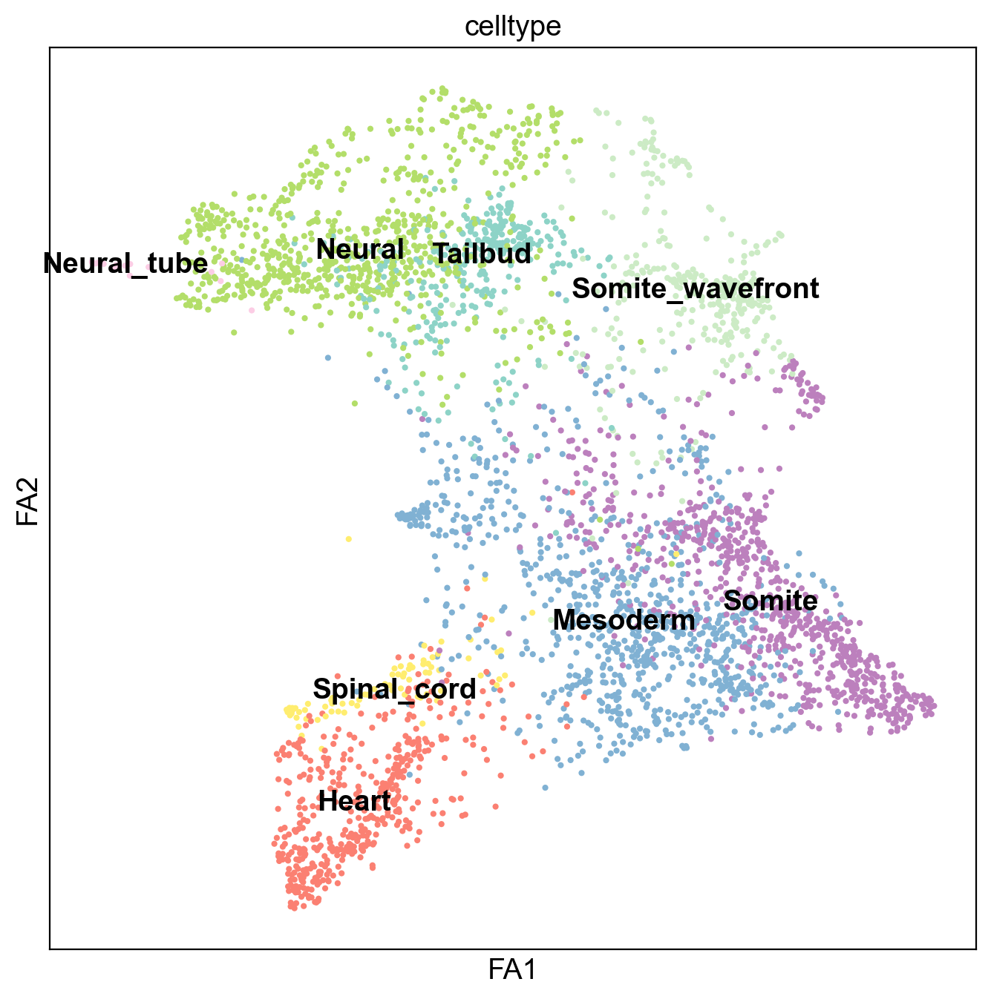

In [36]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.draw_graph(adata_sub, color='celltype', ax=ax,legend_loc='on data')

This looks pretty messy.

#### Optional: Denoising the graph

To denoise the graph, we represent it in diffusion map space (and not in PCA space). Computing distances within a few diffusion components amounts to denoising the graph - we just take a few of the first spectral components. It’s very similar to denoising a data matrix using PCA. The approach has been used in a couple of papers, see e.g. Schiebinger et al. (2017) or Tabaka et al. (2018). It’s also related to the principles behind MAGIC Dijk et al. (2018).

This is not a necessary step, neither for PAGA, nor clustering, nor pseudotime estimation. You might just as well go ahead with a non-denoised graph. In many situations (also here), this will give you very decent results.

In [37]:
sc.tl.diffmap(adata_sub)
sc.pp.neighbors(adata_sub, n_neighbors=10, use_rep='X_diffmap')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9949126  0.99115914 0.98712915 0.9844805  0.97892684
     0.97821635 0.9770516  0.97481346 0.9737421  0.97157246 0.9693322
     0.96591866 0.96531945 0.964586  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [38]:
sc.tl.draw_graph(adata_sub)

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:17)


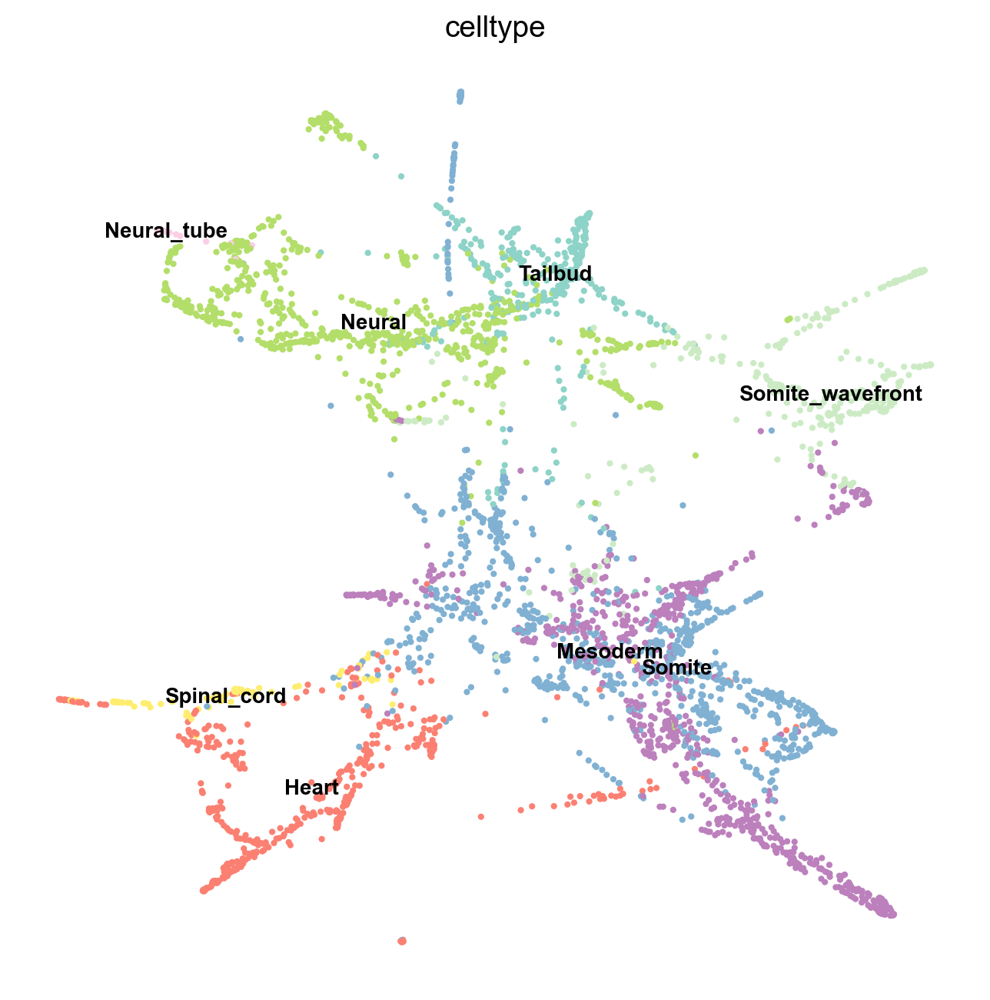

In [39]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.draw_graph(adata_sub, color='celltype', ax=ax, legend_loc='on data', frameon = False, legend_fontsize = 10)

This still looks messy, but in a different way: a lot of the branches are overplotted.

For simple, coarse-grained visualization, compute the PAGA graph, a coarse-grained and simplified (abstracted) graph. Non-significant edges in the coarse- grained graph are thresholded away.

In [40]:
sc.tl.paga(adata_sub, groups='celltype')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


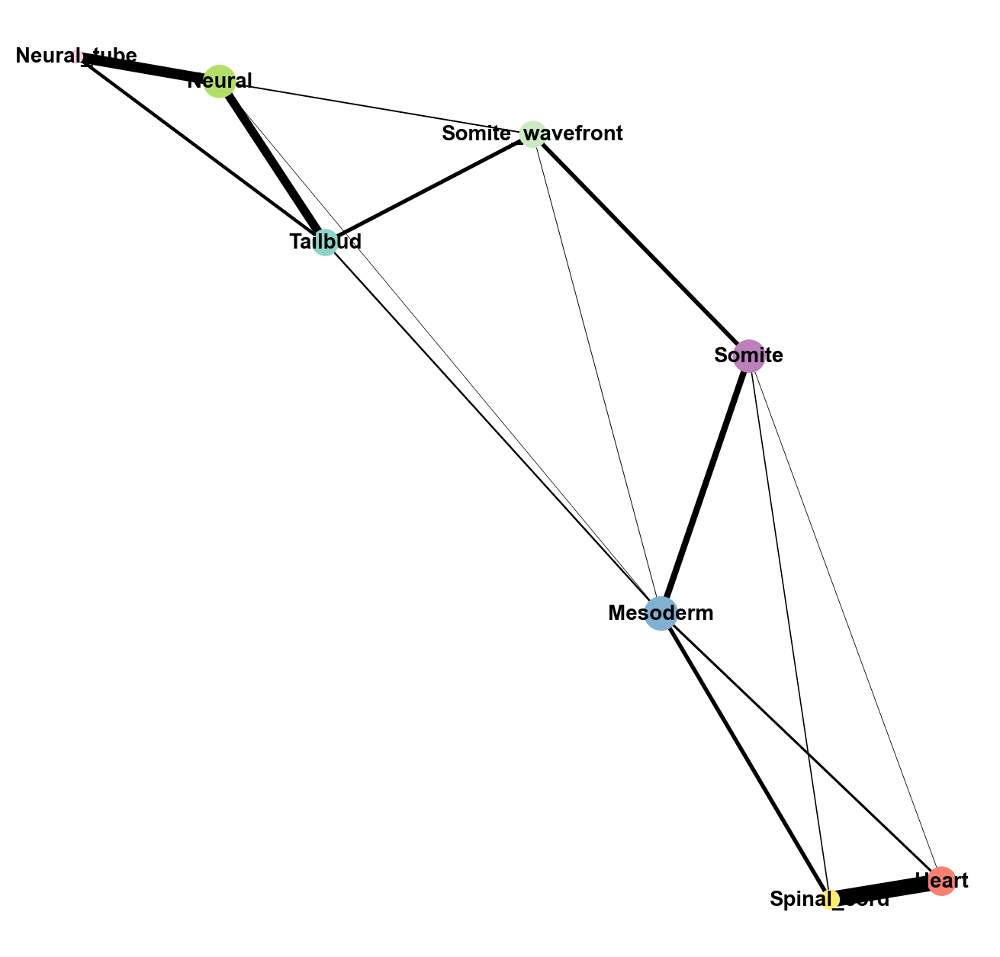

In [41]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='celltype', ax=ax, threshold = 0.03, frameon=False, fontsize = 10)

We can also plot expression of (marker) genes on this graph.

--> added 'pos', the PAGA positions (adata.uns['paga'])


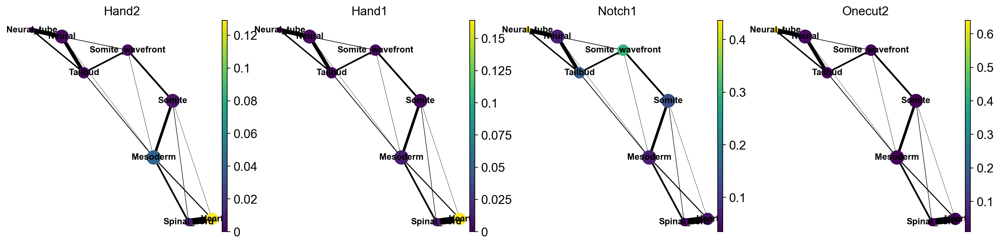

In [42]:
sc.pl.paga(adata_sub, color=['Hand2','Hand1', 'Notch1','Onecut2'], threshold = 0.03, frameon=False, fontsize = 10)

Now, let's re-compute the embedding so we can see all marker genes also at single-cell resolution.

In [43]:
sc.tl.draw_graph(adata_sub, init_pos='paga')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:18)


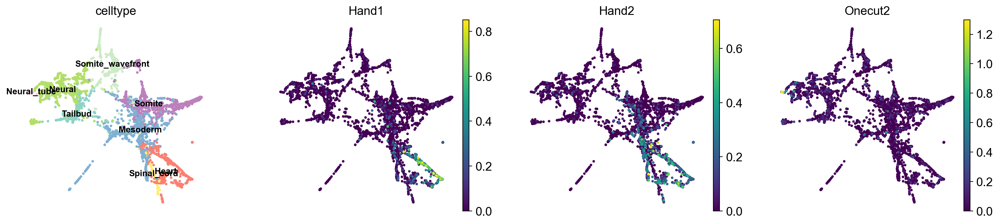

In [44]:
sc.pl.draw_graph(adata_sub, color=['celltype', 'Hand1', 'Hand2', 'Onecut2'], legend_fontsize  = 10, frameon = False, legend_loc='on data')

#### Reconstructing gene changes along PAGA paths for a given set of genes

Choose a root node for diffusion pseudotime.

In [45]:
adata_sub.uns['iroot'] = np.flatnonzero(adata_sub.obs['celltype']  == 'Heart')[0]

In [46]:
sc.tl.dpt(adata_sub, n_branchings = 3)

computing Diffusion Pseudotime using n_dcs=10
    this uses a hierarchical implementation
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs)
    'dpt_groups', the branching subgroups of dpt (adata.obs)
    'dpt_order', cell order (adata.obs) (0:00:02)


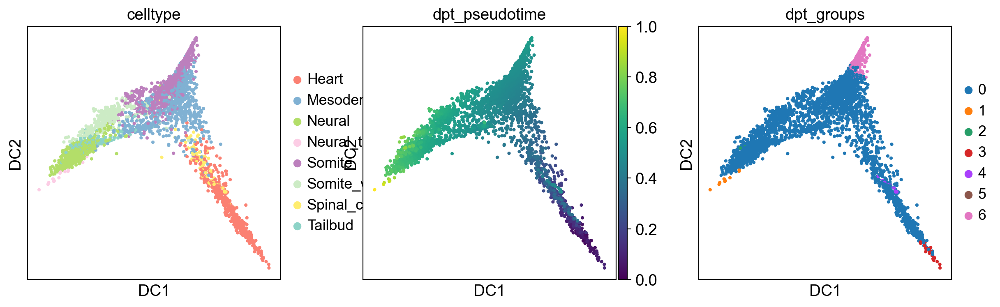

In [47]:
sc.pl.diffmap(adata_sub, color = ['celltype','dpt_pseudotime', 'dpt_groups'])

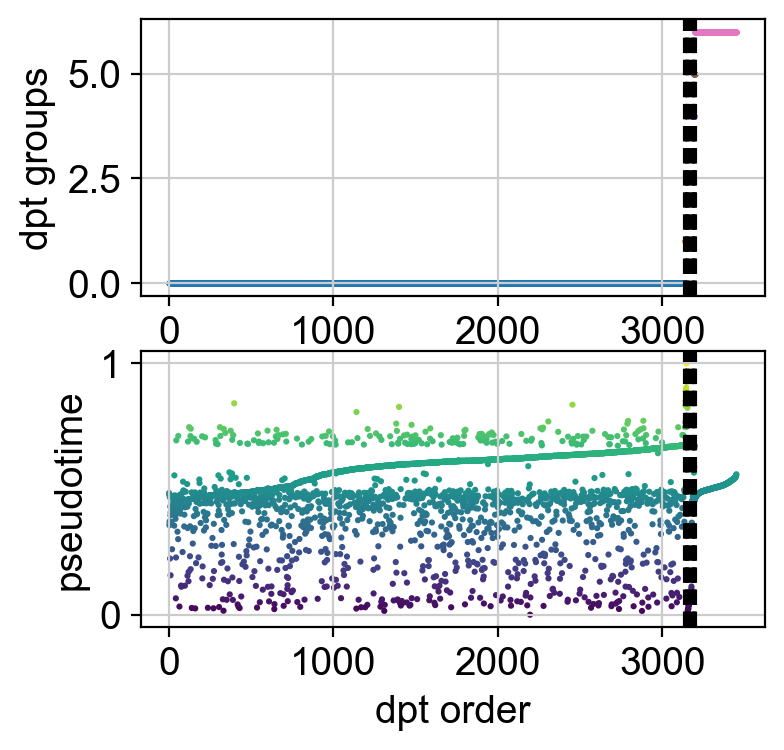

In [48]:
sc.pl.dpt_groups_pseudotime(adata_sub)

In [49]:
#sc.pl.dpt_timeseries(adata_sub)

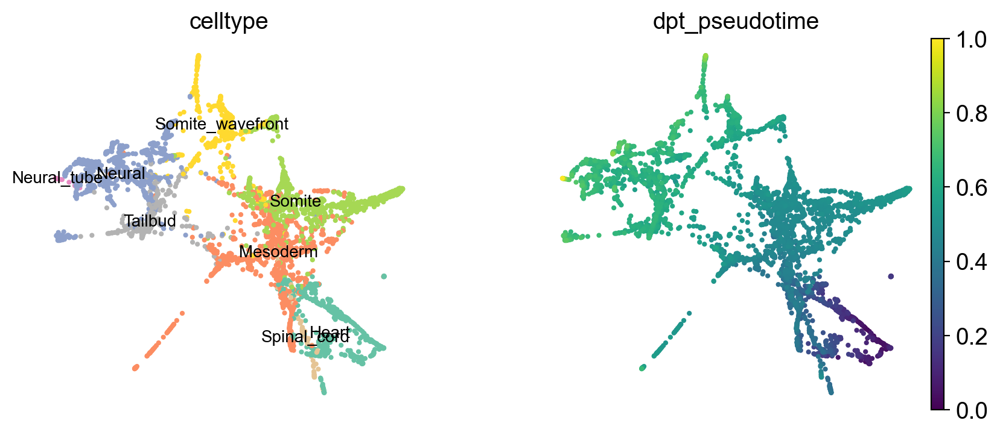

In [50]:
sc.pl.draw_graph(adata_sub, color=['celltype', 'dpt_pseudotime'], legend_loc='on data',palette='Set2', frameon = False, legend_fontweight='light',legend_fontsize = 10)

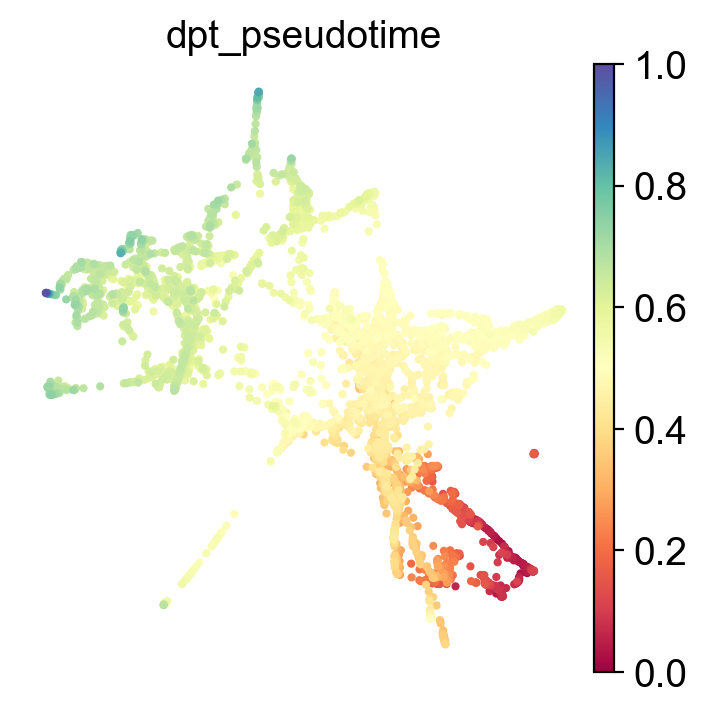

In [51]:
sc.pl.draw_graph(adata_sub, color='dpt_pseudotime', legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

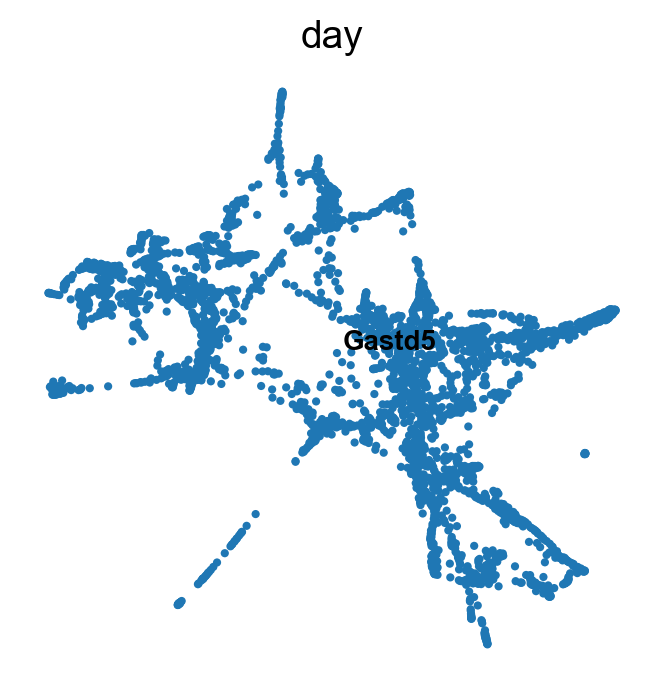

In [52]:
sc.pl.draw_graph(adata_sub, color=['day'],legend_loc='on data',palette=['tab:blue', 'tab:orange','tab:green'], frameon = False, legend_fontsize = 10)

--> added 'pos', the PAGA positions (adata.uns['paga'])


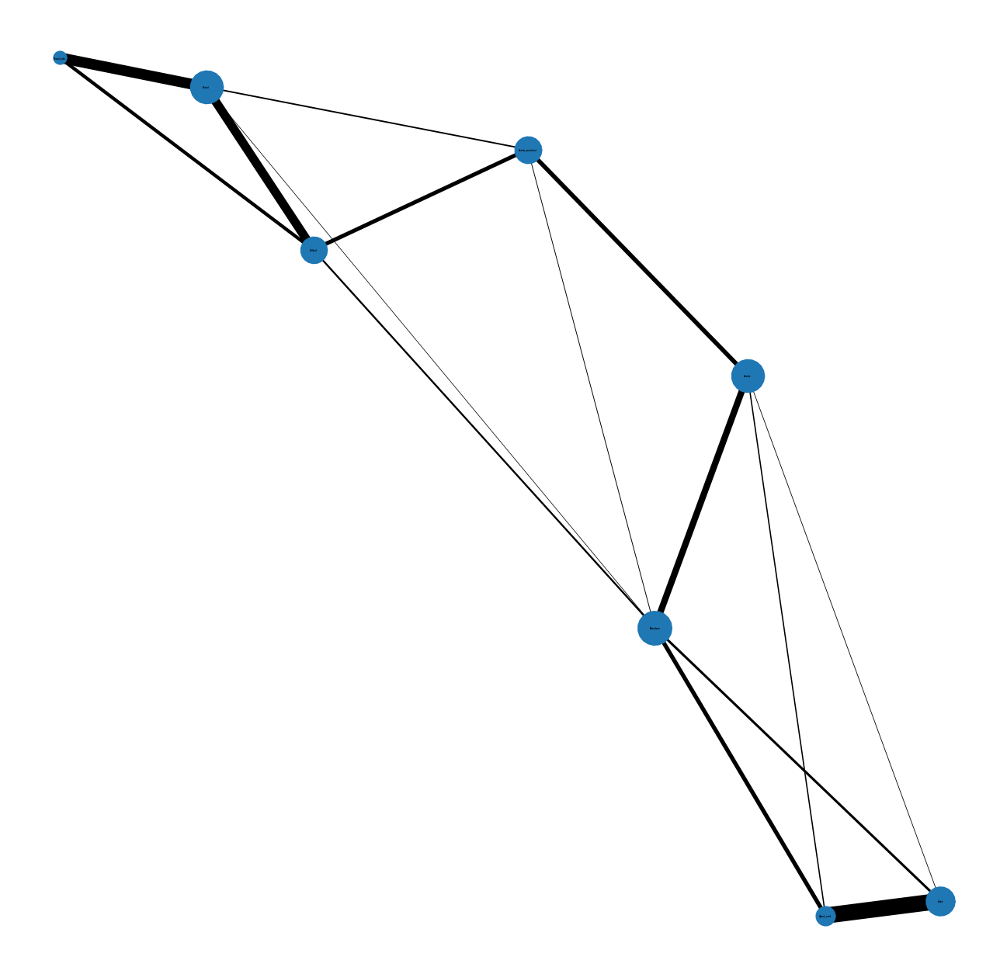

In [53]:
fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='day', threshold = 0.03,ax=ax, frameon=False, fontsize = 1)

--> added 'pos', the PAGA positions (adata.uns['paga'])


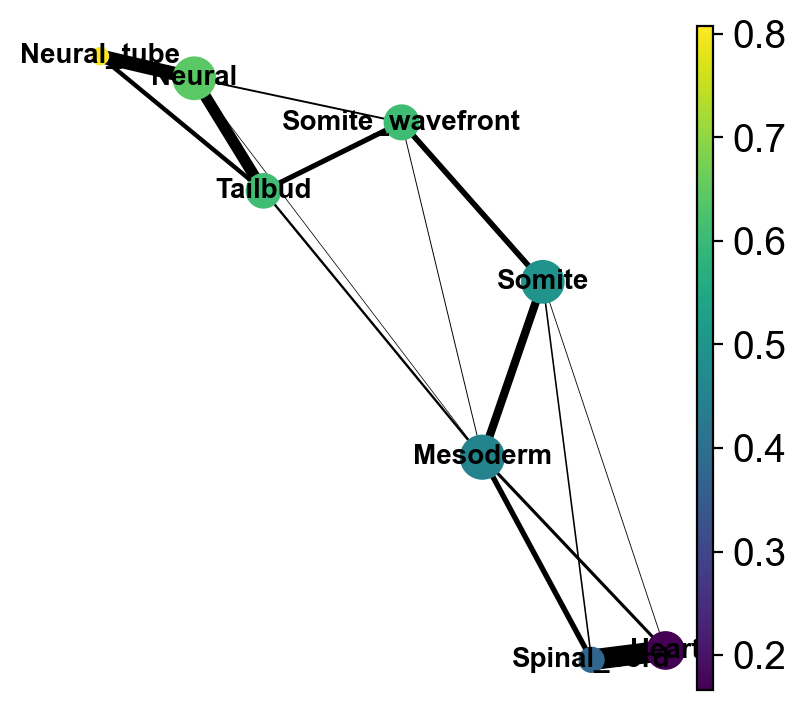

In [54]:
#fig, ax = plt.subplots(figsize=(8,8))
sc.pl.paga(adata_sub, color='dpt_pseudotime',threshold = 0.03,  frameon = False,fontsize = 10)

# Use wishbone

Rerun the computation of the tsne and diffmap if you have subsetted the data.

In [ ]:
#sc.tl.tsne(adata=adata_sub, n_pcs=5, perplexity=30)
#sc.tl.diffmap(adata_sub, n_comps=10)

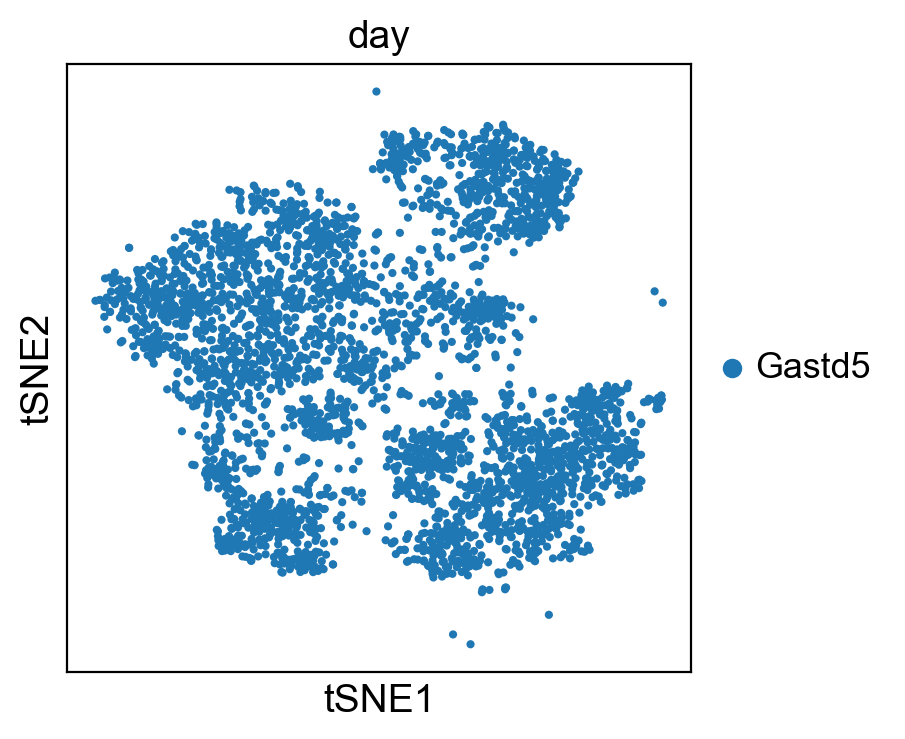

In [55]:
sc.pl.tsne(adata_sub, color = 'day')

We can use the pseudotime calculated by PAGA to pick our root cell for wishbone. Just pick the cell with the lowest pseudotime

In [56]:
adata_sub.obs.sort_values(by=['dpt_pseudotime']).head(2)

,n_counts,n_genes,percent_mito,batch,day,replicates,mark,umap_density_mark,leiden,louvain,celltype,cellnames,bc,cellname,dpt_pseudotime,dpt_groups,dpt_order,dpt_order_indices
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATCATGC,14483.0,4914,0.135963,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1,Gastd5,rep2,H3K27me3,0.285893,1,2,Heart,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATCATGC,74,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_74,0.000000,0,2196,1753
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-4:CCCTAGTA,11400.0,4174,0.149407,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-4,Gastd5,rep2,H3K27me3,0.297603,1,2,Heart,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-4:CCCTAGTA,364,PZ-MB-TChIC-Gastd5-rep2-H3K27me3-4_364,0.014989,0,2877,3034


Actually run wishbone

In [57]:
sce.tl.wishbone(adata=adata_sub, start_cell='PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1:AATCATGC',
                components=[1,2,3], num_waypoints=250,branch=True)

Building lNN graph...
lNN computed in : 0.03 seconds
Determining waypoints if not specified...
Determining shortest path distances and perspectives....
..........................................................................................................................................................................................................................................................
Time for determining distances and perspectives: 81.00 seconds
Determining branch point and branch associations...
Running iterations...
Iteration: 2
Correlation with previous iteration:  0.9983
1 realignment iterations


Now we can see how well wishbone did with calculating pseudotime and determining branches.

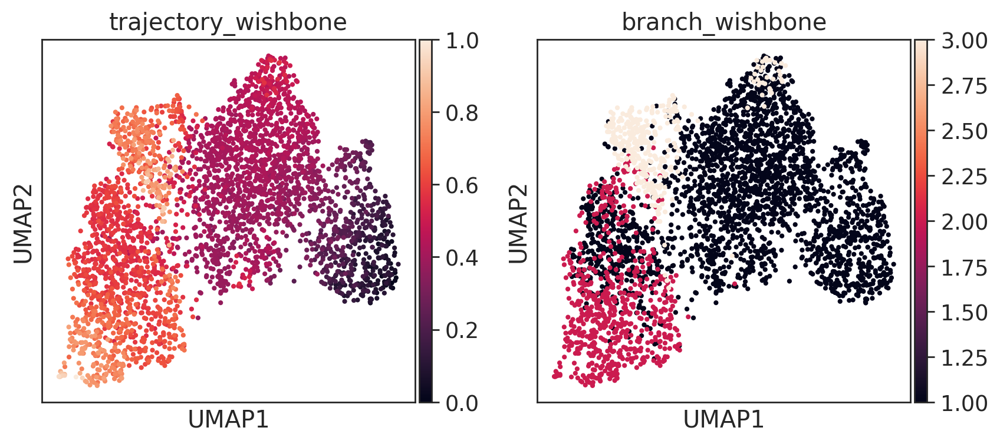

In [58]:
sc.pl.umap(adata_sub, color=['trajectory_wishbone', 'branch_wishbone'])


Some other plots

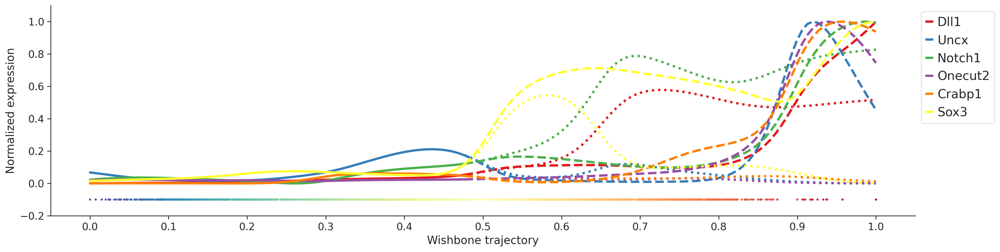

In [59]:
markers = ['Dll1','Uncx','Notch1','Onecut2','Crabp1','Sox3']
fig, ax = plt.subplots(figsize=(20,5))
sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show=True)

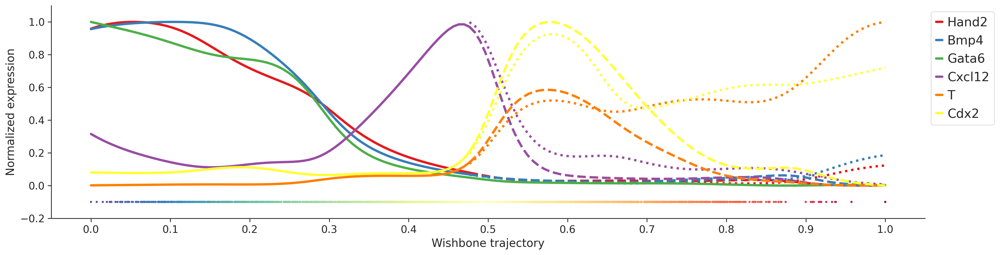

In [61]:
#mpl.style.use('seaborn-white')
markers = ['Hand2','Bmp4','Gata6','Cxcl12','T','Cdx2']
fig, ax = plt.subplots(figsize=(20,5))

sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show=True)

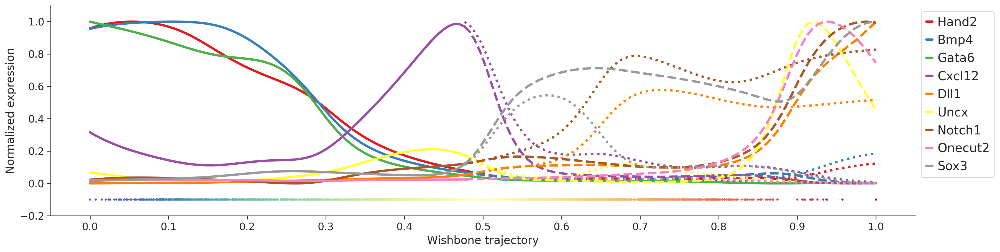

In [66]:
markers = ['Hand2','Bmp4','Gata6','Cxcl12','Dll1','Uncx','Notch1','Onecut2','Sox3']
fig, ax = plt.subplots(figsize=(20,5))

sce.pl.wishbone_marker_trajectory(adata_sub, markers,ax=ax, show=True)

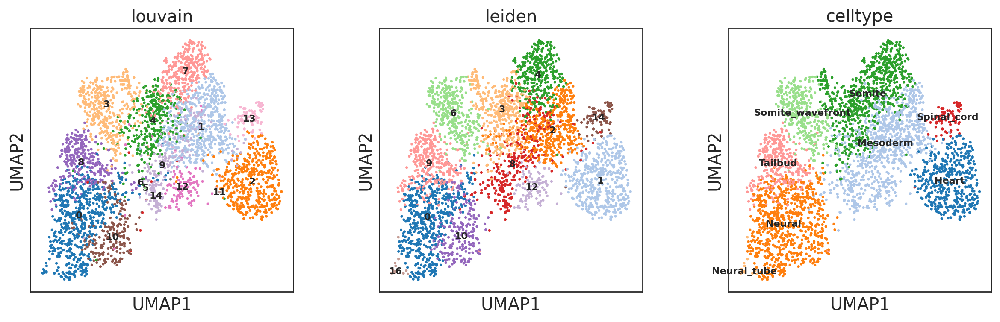

In [62]:
sc.pl.umap(adata_sub, color=['louvain','leiden', 'celltype'], palette=sns.color_palette("tab20", 17), legend_loc = "on data", legend_fontsize=8,  size=20)

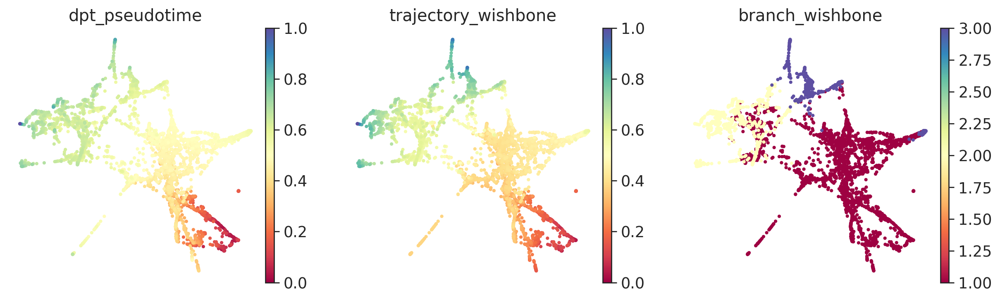

In [63]:
sc.pl.draw_graph(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'branch_wishbone'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

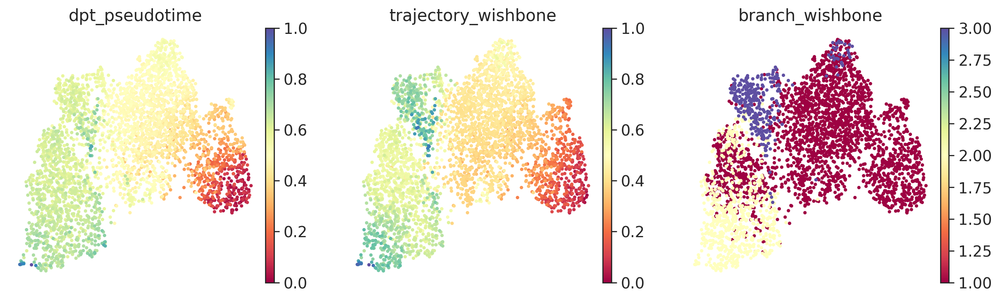

In [64]:
sc.pl.umap(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'branch_wishbone'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

# Computing RNA velocity

filter and normalise

In [ ]:
#scv.pp.filter_genes(adata_sub, min_shared_counts=10)
#scv.pp.normalize_per_cell(adata_sub)
#scv.pp.filter_genes_dispersion(adata_sub, n_top_genes=8000)
#scv.pp.log1p(adata_sub)

In [ ]:
#scv.pp.filter_and_normalize(adata_sub, min_shared_counts=10, n_top_genes=5000)
#scv.pp.moments(adata_sub, n_pcs=30, n_neighbors=30)

actually calculate velocity

In [27]:
scv.tl.velocity(adata_sub)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:07) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:20) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [28]:
scv.tl.velocity_graph(adata_sub)

computing velocity graph
    finished (0:02:20) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


## Project velocities

We can choose different ways of visualising the velocity onto the umap

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


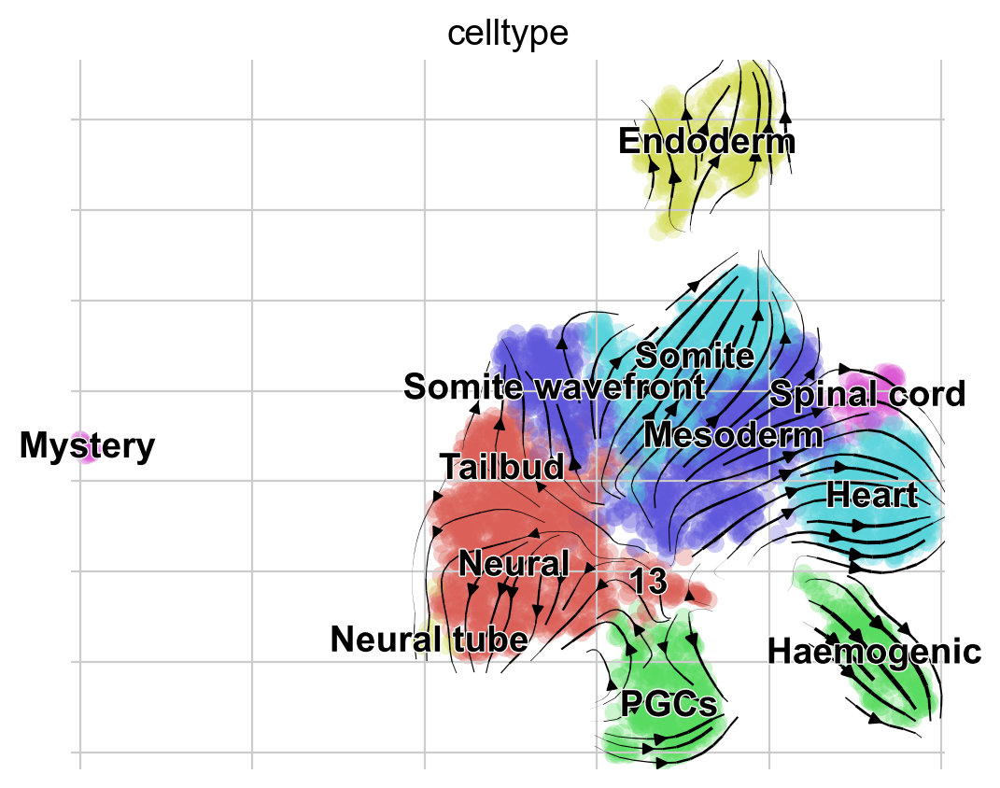

In [29]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax, basis='umap', color = 'celltype', palette=sns.color_palette("hls", 6))

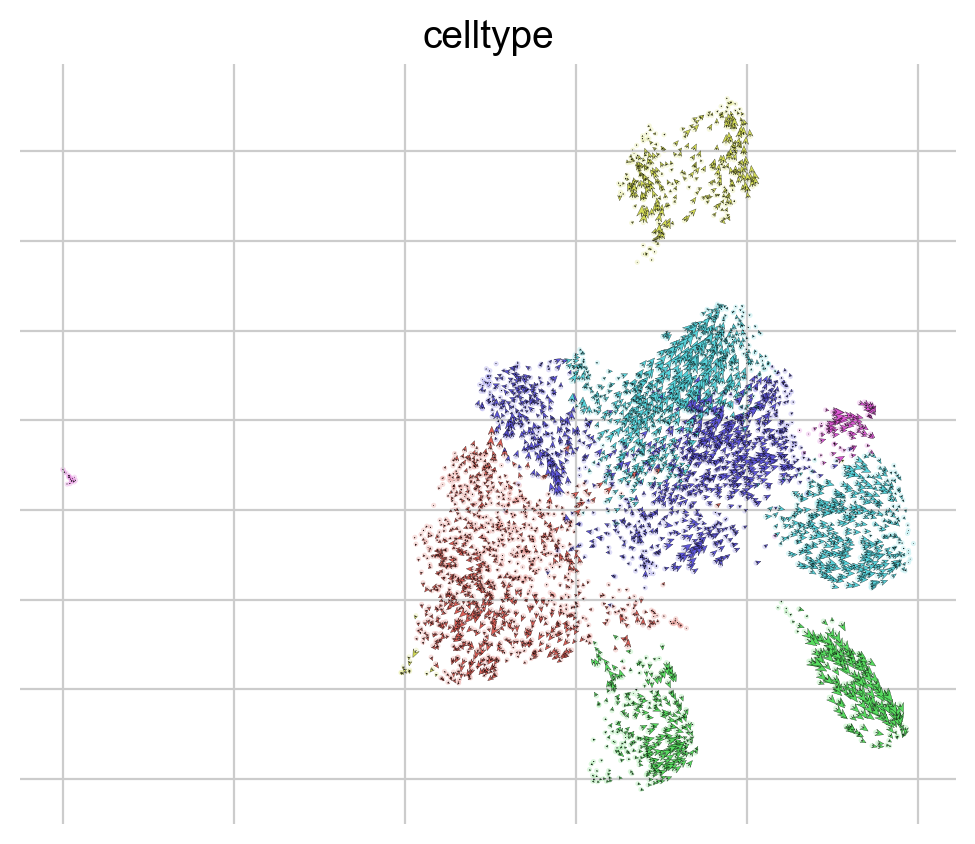

In [30]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding(adata_sub, ax=ax, arrow_length=3, arrow_size=2, dpi=120, color = 'celltype', palette=sns.color_palette("hls", 6))

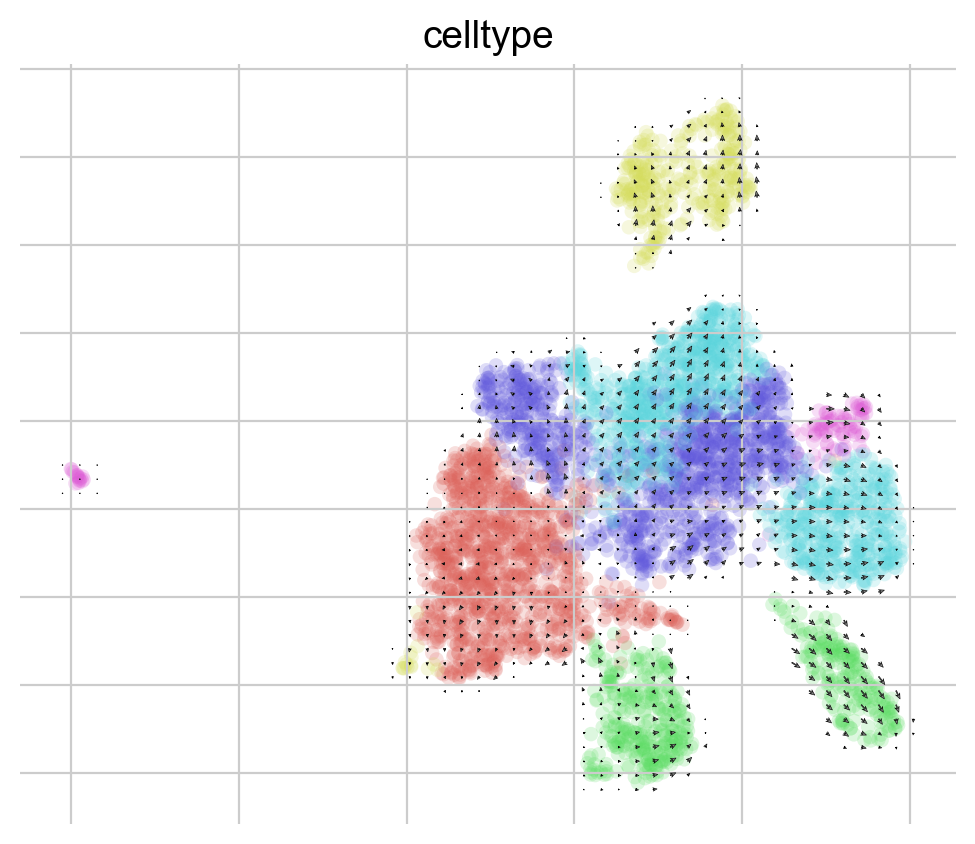

In [31]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_grid(adata_sub, ax=ax, basis='umap', color = 'celltype', palette=sns.color_palette("hls", 6))

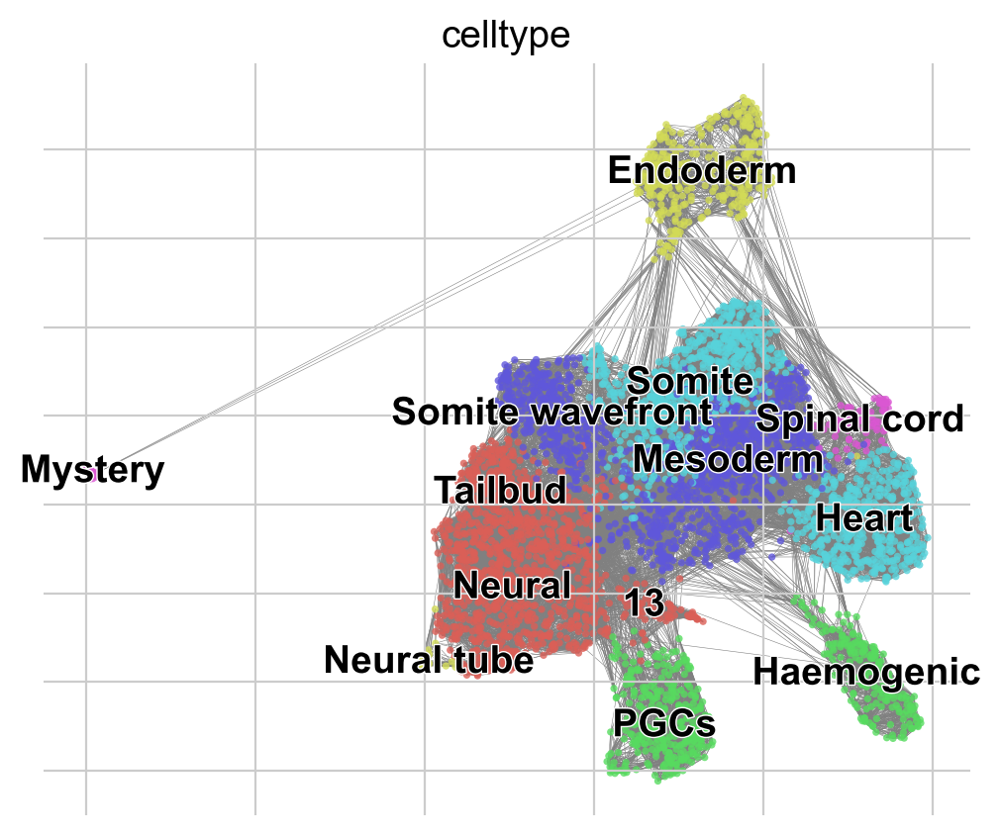

In [32]:
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_graph(adata_sub, ax=ax, color = 'celltype', palette=sns.color_palette("hls", 6))

The cell cycle detected by RNA velocity, is biologically affirmed by cell cycle scores (standardized scores of mean expression levels of phase marker genes).

In [ ]:
scv.tl.score_genes_cell_cycle(adata_sub)
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.scatter(adata_sub, ax=ax,color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

Two more useful stats: - The speed or rate of differentiation is given by the length of the velocity vector. - The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


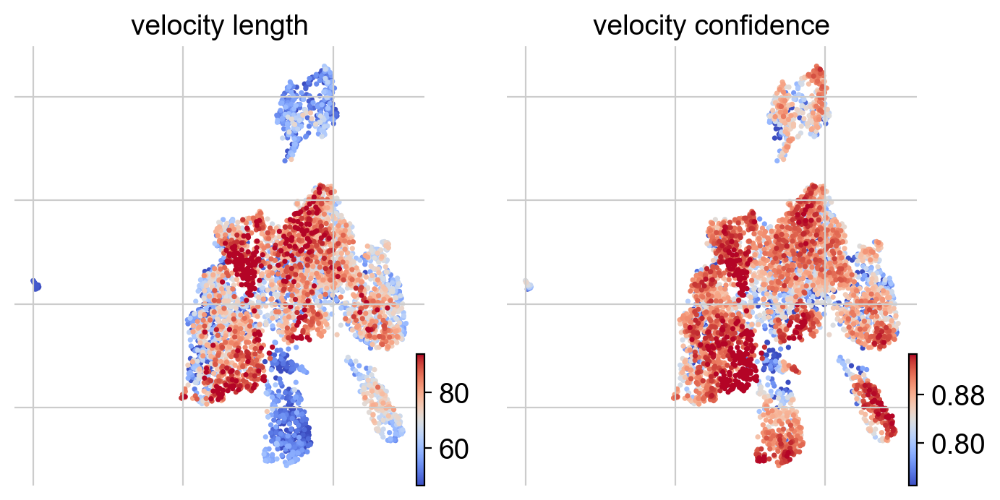

In [33]:
scv.tl.velocity_confidence(adata_sub)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata_sub, c=keys, cmap='coolwarm', perc=[5, 95])

We can also calculate and plot the velocity pseudotime

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


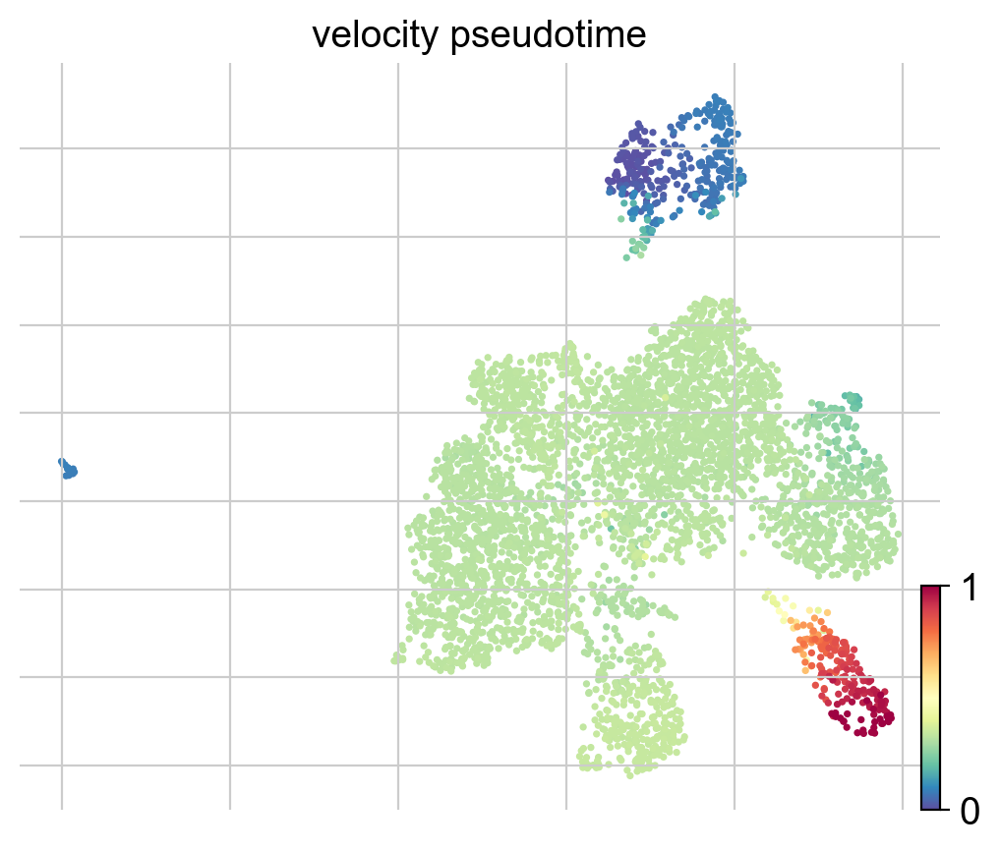

In [34]:
scv.tl.velocity_pseudotime(adata_sub)
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.scatter(adata_sub, ax=ax, color='velocity_pseudotime', cmap='Spectral_r')

To see the different batches on top of the 'velocity' umap, just change the 'color'.

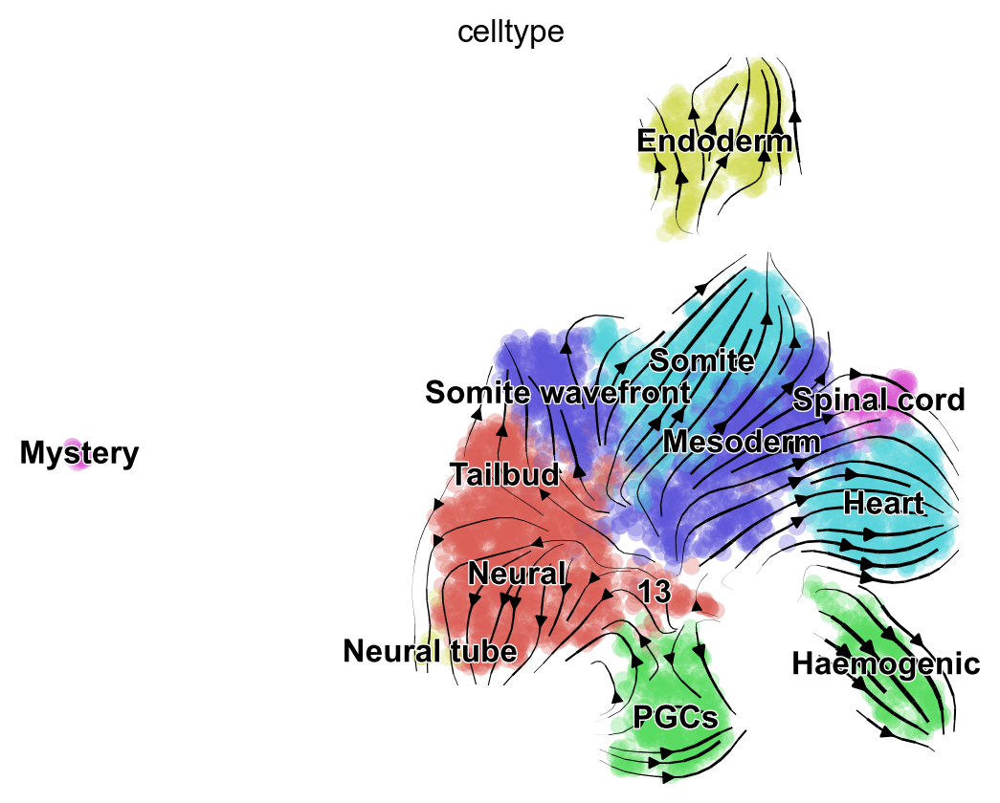

In [35]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax,
                                 basis='umap', 
                                 color=['celltype'],palette=sns.color_palette("hls", 6))

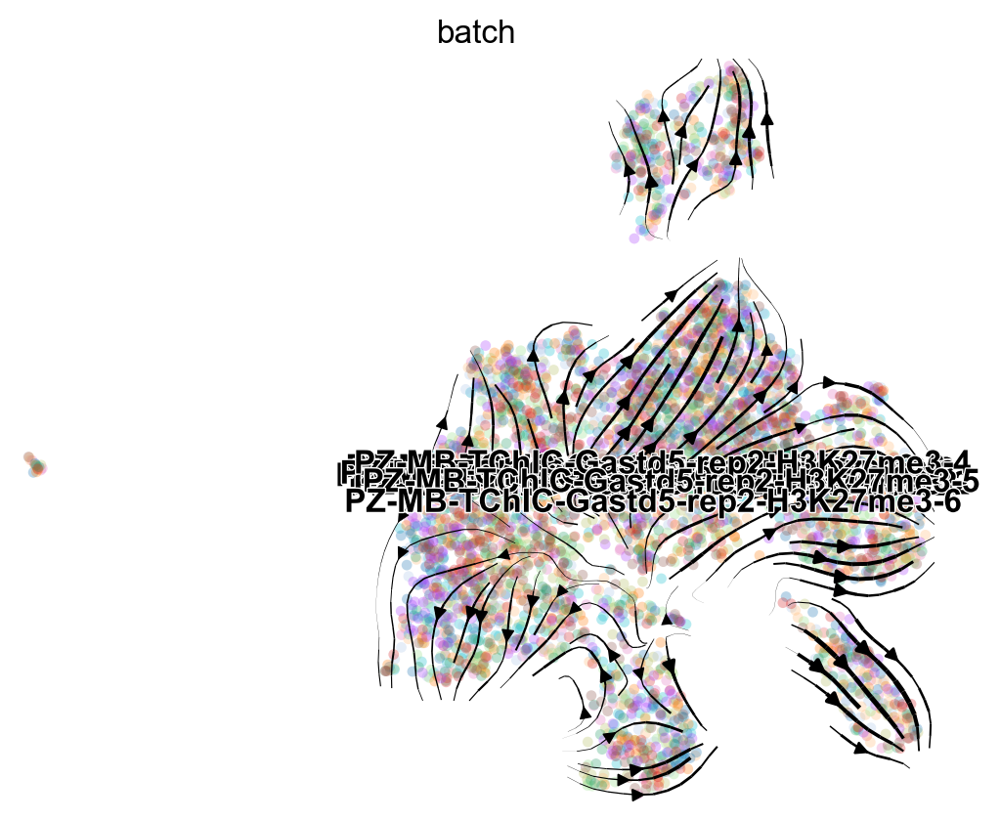

In [36]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, ax=ax,
                                 basis='umap', 
                                 color='batch',palette=sc.pl.palettes.default_20, size = 60)

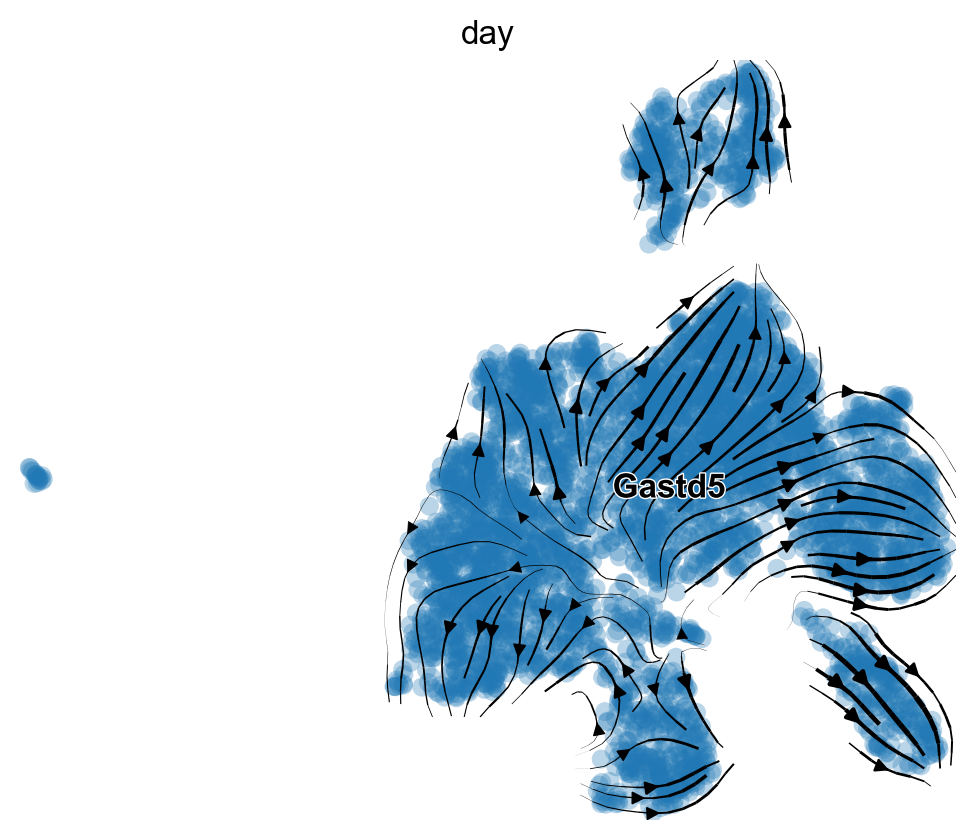

In [37]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, 
                                 basis='umap', ax=ax,
                                 color='day',palette=sc.pl.palettes.default_20)

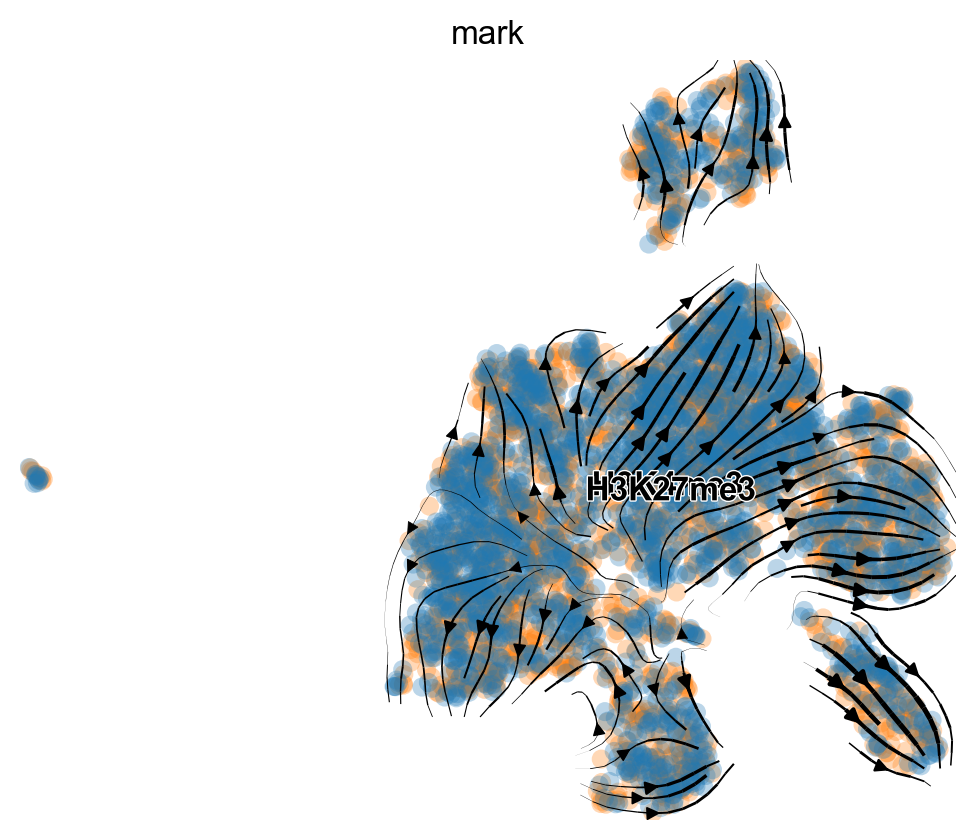

In [38]:
scv.settings.set_figure_params('scvelo')
fig, ax = plt.subplots(figsize=(6,5))
scv.pl.velocity_embedding_stream(adata_sub, 
                                 basis='umap', ax=ax,
                                 color='mark',palette=sc.pl.palettes.default_20)

In [ ]:
sc.pl.draw_graph(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'velocity_pseudotime'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

In [ ]:
sc.pl.umap(adata_sub, color=['dpt_pseudotime','trajectory_wishbone', 'velocity_pseudotime'],legend_loc='on data',color_map='Spectral', frameon = False, legend_fontsize = 10)

Plotting our favourite genes in terms of velocity:

In [ ]:
sc.pl.umap(adata_sub, color = "Foxb1", color_map = "viridis", use_raw=True)

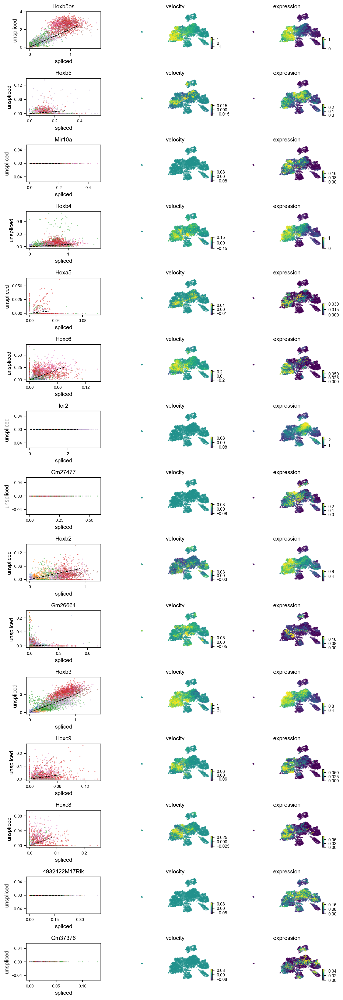

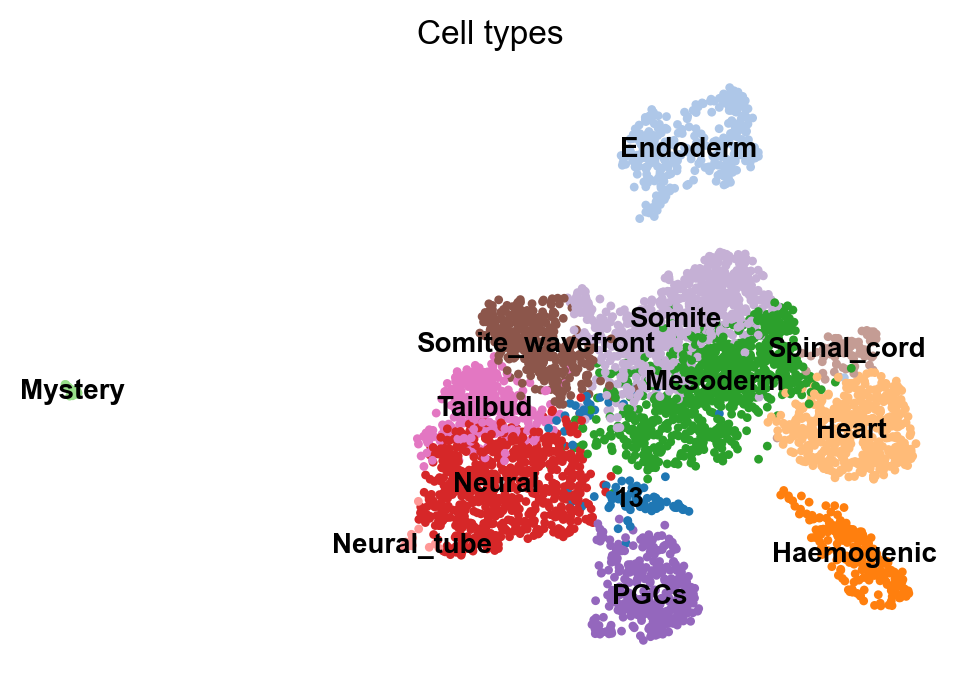

TypeError: unsupported operand type(s) for +: 'NoneType' and 'NoneType'

In [41]:
scv.pl.velocity(adata_sub, var_names=genes, color = "celltype", 
                palette=sns.color_palette('tab20',13),color_map='viridis', ncols=1) + sc.pl.umap(adata_sub, color='celltype', palette=sns.color_palette('tab20',13), 
                                                                             legend_loc = "on data", title='Cell types', legend_fontsize=10, frameon=False, size = 40)

In [ ]:
scv.pl.velocity(adata_sub, var_names=markergenes, color = "celltype", ncols=1)

To define the top velocity genes, we need to rank them per cluster.

In [ ]:
scv.tl.rank_velocity_genes(adata_sub, groupby = 'celltype', min_counts = 1, resolution=0.4)

pd.DataFrame(adata_sub.uns['rank_velocity_genes']['names']).head(10)

We can then visualise these too.

In [ ]:
scv.pl.velocity(adata_sub, var_names=pd.DataFrame(adata_sub.uns['rank_velocity_genes']['names']).head(5).values.flatten(), ncols=1, colorbar=True)

In [ ]:
#sc.pl.umap(adata_sub, color=['initial_size_spliced','initial_size_unspliced','velocity_self_transition'], color_map = 'viridis')

# save

During the course of this analysis, the AnnData accumlated the following annotations.

In [82]:
adata_sub

AnnData object with n_obs × n_vars = 3452 × 27312
    obs: 'n_counts', 'n_genes', 'percent_mito', 'batch', 'day', 'replicates', 'mark', 'umap_density_mark', 'leiden', 'louvain', 'celltype', 'cellnames', 'bc', 'cellname', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'trajectory_wishbone', 'branch_wishbone', 'velocity_self_transition', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'batch_colors', 'celltype_colors', 'day_colors', 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'mark_colors', 'neighbors', 'pca', 'rank_genes_groups', 'replicates_colors', 'umap', 'umap_density_mark_params', 'draw_

In [83]:
pathToData

'/Users/m.blotenburg/Documents/Projects/TCHIC/data/rep2/20210215_OUD5651_K27me3K4me3_day5_20201023fixed/'

In [84]:
results_file = pathToData + '/dataframes/20210223_TCHIC_rep2_trajectories_main.h5ad' 
adata_sub.write(results_file, compression='gzip')  # `compression='gzip'` saves disk space, but slows down writing and subsequent reading

Get a rough overview of the file using `h5ls`, which has many options - for more details see [here](https://github.com/theislab/scanpy_usage/blob/master/170505_seurat/info_h5ad.md). The file format might still be subject to further optimization in the future. All reading functions will remain backwards-compatible, though.

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations.

In [ ]:
#adata.X = None
#adata.write('./write/Scanpy120hAA.h5ad', compression='gzip')

If you want to export to "csv", you have the following options:

In [ ]:
# Export single fields of the annotation of observations
# adata.obs[['n_counts', 'louvain_groups']].to_csv(
#     './write/pbmc3k_corrected_louvain_groups.csv')

# Export single columns of the multidimensional annotation
# adata.obsm.to_df()[['X_pca1', 'X_pca2']].to_csv(
#     './write/pbmc3k_corrected_X_pca.csv')

# Or export everything except the data using `.write_csvs`.
# Set `skip_data=False` if you also want to export the data.
# adata.write_csvs(results_file[:-5], )